## Catalog of LSB objects around Fornax for proposal

Here I present a catalog of UDGs (Generally low Surface Brightness - LSB) galaxies in a region $15' \times 15' $ around Fornax.

Coordinates of the center of Fornax:
\begin{equation}
RA_f = 54.61625 \\
DEC_f = −35.448333 
\end{equation}

Since $15' = 0.25^o$ we select a region $\pm 0.125^o$ around the center of Fornax cluster:

\begin{equation}
54.49125 \leq RA \leq 54.74125 \\
.\\
-35.573333 \leq DEC \leq -35.323333
\end{equation}

In this notebook, instead of applying cuts and try to find UDGs/LSB galaxies, I use the objects in the Muñoz et al catalogue (arXiv: 1510.02475). I match them to the DES data and select candidates in the above region. I inspect them visually to be sure that they are indeed LSB/UDG objects.

Then, I keep only the true detections and create a file with their properties (positions, magnitudes, surface brightness etc).

In [292]:
# Import stuff
import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt
from astropy.io import fits
import skymapper as skm
from code.plot_utils import plot_pretty
from astropy import units as u
from astropy.coordinates import SkyCoord

%matplotlib inline
%pylab inline 
plot_pretty()

Populating the interactive namespace from numpy and matplotlib


#### Import the DES catalogue

In [293]:
DES = fits.open('For_proposal_Munoz.fits')
print DES[1].header.keys

<bound method Header.keys of XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   88 / length of dimension 1                          
NAXIS2  =               345648 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   20 / number of table fields                         
TTYPE1  = 'ra      '                                                            
TFORM1  = 'D       '                                                            
TTYPE2  = 'dec     '                                                            
TFORM2  = 'D       '                                                            

##### Import and make some preliminary cuts

Let's import the DES data and make the following preliminary cuts:

\begin{equation}
spread\_model\_i + (5/3)spreaderr\_model\_i > 0.007
\end{equation}

For star-galaxy separation (keep only galaxies)

In [294]:
# Import the data first
# =================================================================
# =================================================================

#spread model i and spreaderr model i
spread_model_i = DES[1].data['spread_model_i']
speraderr_model_i = DES[1].data['spreaderr_model_i']

#RA and DEC  of every object
RA = DES[1].data['ra']
DEC = DES[1].data['dec']

# Auto magnitudes
MAG_AUTO_G = DES[1].data['mag_auto_g']
MAG_AUTO_R = DES[1].data['mag_auto_r']
MAG_AUTO_I = DES[1].data['mag_auto_i']

# Flux radii (pixels)
FLUX_RADIUS_G = DES[1].data['flux_radius_g']
FLUX_RADIUS_R = DES[1].data['flux_radius_r']
FLUX_RADIUS_I = DES[1].data['flux_radius_i'] 

# Kron radius
KRON_RAD = DES[1].data['kron_radius']

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G = DES[1].data['mu_eff_model_g']
MU_EFF_R = DES[1].data['mu_eff_model_r']
MU_EFF_I = DES[1].data['mu_eff_model_i']

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G = DES[1].data['mu_max_g']
MU_MAX_R = DES[1].data['mu_max_r']
MU_MAX_I = DES[1].data['mu_max_i']

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G = DES[1].data['mu_mean_model_g']
MU_MEAN_R = DES[1].data['mu_mean_model_r']
MU_MEAN_I = DES[1].data['mu_mean_model_i']

print(len(RA))


345648


In [295]:
# Make the  star-galaxy separation cuts now
# =================================================================
# =================================================================

# Star-galaxy separation
star_gal_cut = ((spread_model_i+(5.0/3.0)*speraderr_model_i)>0.007)

#RA and DEC
RA = RA[star_gal_cut]
DEC = DEC[star_gal_cut]

#Auto magnitudes
MAG_AUTO_G = MAG_AUTO_G[star_gal_cut]
MAG_AUTO_R = MAG_AUTO_R[star_gal_cut]
MAG_AUTO_I = MAG_AUTO_I[star_gal_cut]

# Flux radii (pixels)
FLUX_RADIUS_G = FLUX_RADIUS_G[star_gal_cut]
FLUX_RADIUS_R = FLUX_RADIUS_R[star_gal_cut]
FLUX_RADIUS_I = FLUX_RADIUS_I[star_gal_cut]

# Kron radius
KRON_RAD = KRON_RAD[star_gal_cut]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G = MU_EFF_G[star_gal_cut]
MU_EFF_R = MU_EFF_R[star_gal_cut]
MU_EFF_I = MU_EFF_I[star_gal_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G = MU_MAX_G[star_gal_cut]
MU_MAX_R = MU_MAX_R[star_gal_cut]
MU_MAX_I = MU_MAX_I[star_gal_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G = MU_MEAN_G[star_gal_cut]
MU_MEAN_R = MU_MEAN_R[star_gal_cut]
MU_MEAN_I = MU_MEAN_I[star_gal_cut]

print(len(RA))

283298


We see that even this simple cut reduces significantly the sample size.

#### Now import the catalog from Muñoz et al. 

In [296]:
RAh, RAm, RAs, DEd, DEm, DEs =  loadtxt("table1.dat",  unpack=3, usecols=[1,2,3,4,5,6])
print(np.size(RAh))

284


Convert from hours, minutes, secs to degrees, as in DES.

The conversion is:

For DEC:

DEC (degrees) = DEd + DEm/60 + DEs/3600

RA (degrees) = RAh$ \times 15$ + RAm/4 + RAs/240

In [297]:
RA_f = RAh*15.0 + RAm/4.0 + RAs/240.0  # Right ascension in degrees for the Muñoz et. al. objects aroud Fornax
DEC_f = - (abs(DEd) + DEm/60.0 + DEs/3600.0)

Match the objects now

In [298]:
coo_DES = SkyCoord(RA*u.deg, DEC*u.deg, frame='icrs') #Coordinates of objects (all) in the DES data
coo_Mun = SkyCoord(RA_f*u.deg, DEC_f*u.deg, frame='icrs')  #Coordinates of objects (all) in the Muñoz et al data

In [299]:
idx_DES, d2d_DES, d3D_DES = coo_Mun.match_to_catalog_sky(coo_DES)

Select now just the matched objects (and their propeties).

In [300]:
# RA and DEC 
RA_m = RA[idx_DES]
DEC_m = DEC[idx_DES]

#Auto magnitudes
MAG_AUTO_G_m = MAG_AUTO_G[idx_DES] 
MAG_AUTO_R_m = MAG_AUTO_G[idx_DES] 
MAG_AUTO_I_m = MAG_AUTO_G[idx_DES] 

#Flux radii(pixels)
FLUX_RADIUS_G_m = FLUX_RADIUS_G[idx_DES]
FLUX_RADIUS_R_m = FLUX_RADIUS_R[idx_DES]
FLUX_RADIUS_I_m = FLUX_RADIUS_I[idx_DES]

# Kron radius
KRON_RAD_m = KRON_RAD[idx_DES]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_m = MU_EFF_G[idx_DES]
MU_EFF_R_m = MU_EFF_R[idx_DES]
MU_EFF_I_m = MU_EFF_I[idx_DES]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_m = MU_MAX_G[idx_DES]
MU_MAX_R_m = MU_MAX_R[idx_DES]
MU_MAX_I_m = MU_MAX_I[idx_DES]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_m = MU_MEAN_G[idx_DES]
MU_MEAN_R_m = MU_MEAN_R[idx_DES]
MU_MEAN_I_m = MU_MEAN_I[idx_DES]

Let's plot them

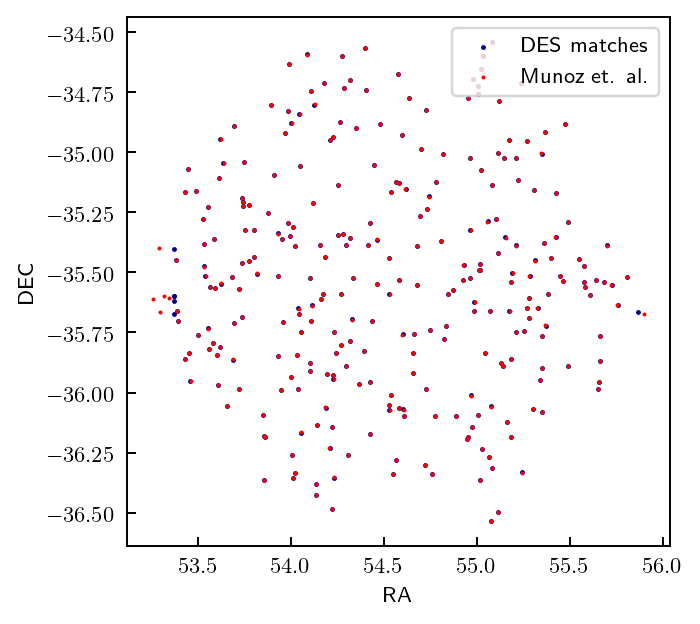

In [301]:
plot_pretty()
fig = plt.figure(figsize=(4.0,4.0))
plt.scatter(RA_m, DEC_m, c='darkblue', s=1.0,  label='DES matches')
plt.scatter(RA_f, DEC_f, c='red', s=0.4, label='Munoz et. al.')
plt.xlabel('RA'); plt.ylabel('DEC')
#plt.xlim(53,56.5)
plt.legend(frameon=True, loc='upper right', fontsize=9)
plt.show()

Next we select a region $15' \times 15'$ around the center of fornax and check how many candidates we have there.

In [302]:
# Define the cut 
central_cut = (RA_m>54.49125)&(RA_m<54.74125)&(DEC_m>-35.57333)&(DEC_m<-35.32333)

#Apply the cut now
# ===============================================================================
# ===============================================================================

# RA and DEC
RA_cent = RA_m[central_cut]
DEC_cent = DEC_m[central_cut]

print(zip(RA_cent,DEC_cent))

[(54.527316999999996, -35.439891000000003), (54.578228000000003, -35.530907999999997), (54.674492000000001, -35.391784999999999), (54.676068999999998, -35.552109999999999)]


The above returned four candidates, out of witch two seem to be true detections.

I will select a $0.25^o \times 0.25^o$ region that seems to have more candidates. Specifically let's try:

\begin{equation}
 53.75 < RA < 54.25\\
 -35.50 < DEC < -35.25
\end{equation}

In [303]:
# Define the cut 
cut_2 = (RA_m>53.75)&(RA_m<54.25)&(DEC_m>-35.50)&(DEC_m<-35.25)

#Apply the cut now
# ===============================================================================
# ===============================================================================

# RA and DEC
RA_2 = RA_m[cut_2]
DEC_2 = DEC_m[cut_2]

#Auto magnitudes
MAG_AUTO_G_2 = MAG_AUTO_G_m[cut_2]
MAG_AUTO_R_2 = MAG_AUTO_R_m[cut_2]
MAG_AUTO_I_2 = MAG_AUTO_I_m[cut_2]

#Flux radii(pixels)
FLUX_RADIUS_G_2 = FLUX_RADIUS_G_m[cut_2]
FLUX_RADIUS_R_2 = FLUX_RADIUS_R_m[cut_2]
FLUX_RADIUS_I_2 = FLUX_RADIUS_I_m[cut_2]

# Kron radius
KRON_RAD_2 = KRON_RAD_m[cut_2]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_2 = MU_EFF_G_m[cut_2]
MU_EFF_R_2 = MU_EFF_R_m[cut_2]
MU_EFF_I_2 = MU_EFF_I_m[cut_2]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_2 = MU_MAX_G_m[cut_2]
MU_MAX_R_2 = MU_MAX_R_m[cut_2]
MU_MAX_I_2 = MU_MAX_I_m[cut_2]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_2 = MU_MEAN_G_m[cut_2]
MU_MEAN_R_2 = MU_MEAN_R_m[cut_2]
MU_MEAN_I_2 = MU_MEAN_I_m[cut_2]


print(len(RA_2))
print(zip(RA_2,DEC_2))

14
[(53.750962000000001, -35.322426), (53.771993000000002, -35.450957000000002), (53.798110999999999, -35.322929999999999), (53.800032999999999, -35.434126999999997), (53.876824999999997, -35.251714999999997), (53.928192000000003, -35.338335000000001), (53.947418999999996, -35.361775999999999), (53.982402999999998, -35.293674000000003), (53.991210000000002, -35.347957000000001), (54.007555000000004, -35.310744999999997), (54.016703, -35.388739999999999), (54.155239999999999, -35.385871000000002), (54.179183000000002, -35.435538999999999), (54.249276999999999, -35.343280999999998)]


Nice, we have 14 candidates now!

After visually inspecting them, I disregard three of the candidates, and keep 11 of them.

In [304]:
#define final cut
fin_cut  = np.full((14), True, dtype=bool)
fin_cut[3] = False; fin_cut[6] = False; fin_cut[7] = False

In [305]:
#Apply final cut
# RA and DEC
RA_fin = RA_2[fin_cut]
DEC_fin = DEC_2[fin_cut]

#Auto magnitudes
MAG_AUTO_G_fin = MAG_AUTO_G_2[fin_cut]
MAG_AUTO_R_fin = MAG_AUTO_R_2[fin_cut]
MAG_AUTO_I_fin = MAG_AUTO_I_2[fin_cut]

#Flux radii(pixels)
FLUX_RADIUS_G_fin = FLUX_RADIUS_G_2[fin_cut]
FLUX_RADIUS_R_fin = FLUX_RADIUS_R_2[fin_cut]
FLUX_RADIUS_I_fin = FLUX_RADIUS_I_2[fin_cut]

# Kron radius
KRON_RAD_fin = KRON_RAD_2[fin_cut]

#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
MU_EFF_G_fin = MU_EFF_G_2[fin_cut]
MU_EFF_R_fin = MU_EFF_R_2[fin_cut]
MU_EFF_I_fin = MU_EFF_I_2[fin_cut]

#Peak surface brightness above background [mag/asec^2]
MU_MAX_G_fin = MU_MAX_G_2[fin_cut]
MU_MAX_R_fin = MU_MAX_R_2[fin_cut]
MU_MAX_I_fin = MU_MAX_I_2[fin_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
MU_MEAN_G_fin = MU_MEAN_G_2[fin_cut]
MU_MEAN_R_fin = MU_MEAN_R_2[fin_cut]
MU_MEAN_I_fin = MU_MEAN_I_2[fin_cut]


In [306]:
print(zip(RA_fin, DEC_fin))

[(53.750962000000001, -35.322426), (53.771993000000002, -35.450957000000002), (53.798110999999999, -35.322929999999999), (53.876824999999997, -35.251714999999997), (53.928192000000003, -35.338335000000001), (53.991210000000002, -35.347957000000001), (54.007555000000004, -35.310744999999997), (54.016703, -35.388739999999999), (54.155239999999999, -35.385871000000002), (54.179183000000002, -35.435538999999999), (54.249276999999999, -35.343280999999998)]


#### Let's see the candidates! They are pleasing!

(Not all of them, the file would be to big and I would not be able to upload it to github)

In [307]:
#from IPython.display import Image
#Image(filename='1.png')

In [308]:
#Image(filename='2.png')

In [309]:
#Image(filename='3.png')

In [310]:
#Image(filename='4.png')

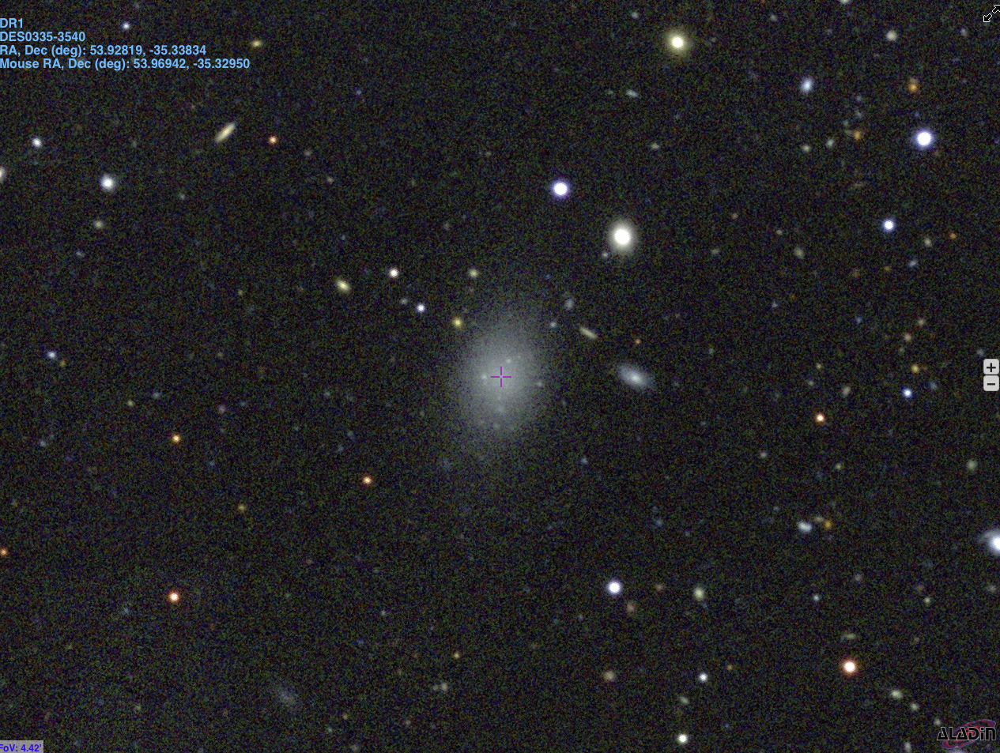

In [311]:
Image(filename='5.png')

In [312]:
#Image(filename='6.png')

In [313]:
#Image(filename='7.png')

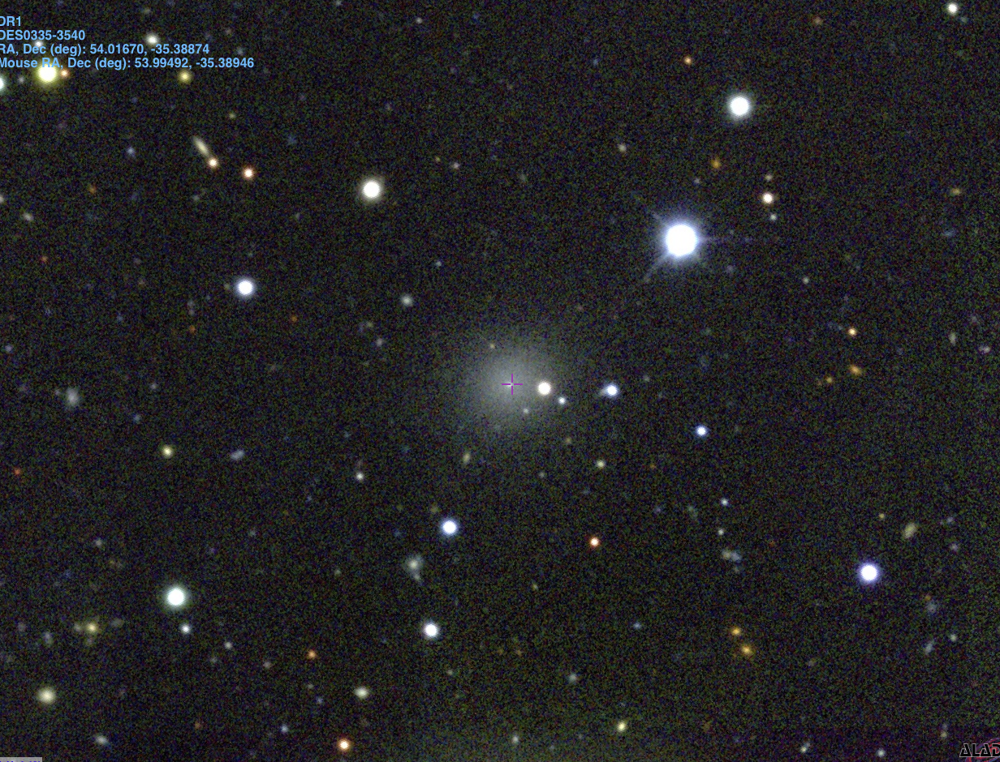

In [314]:
Image(filename='8.png')

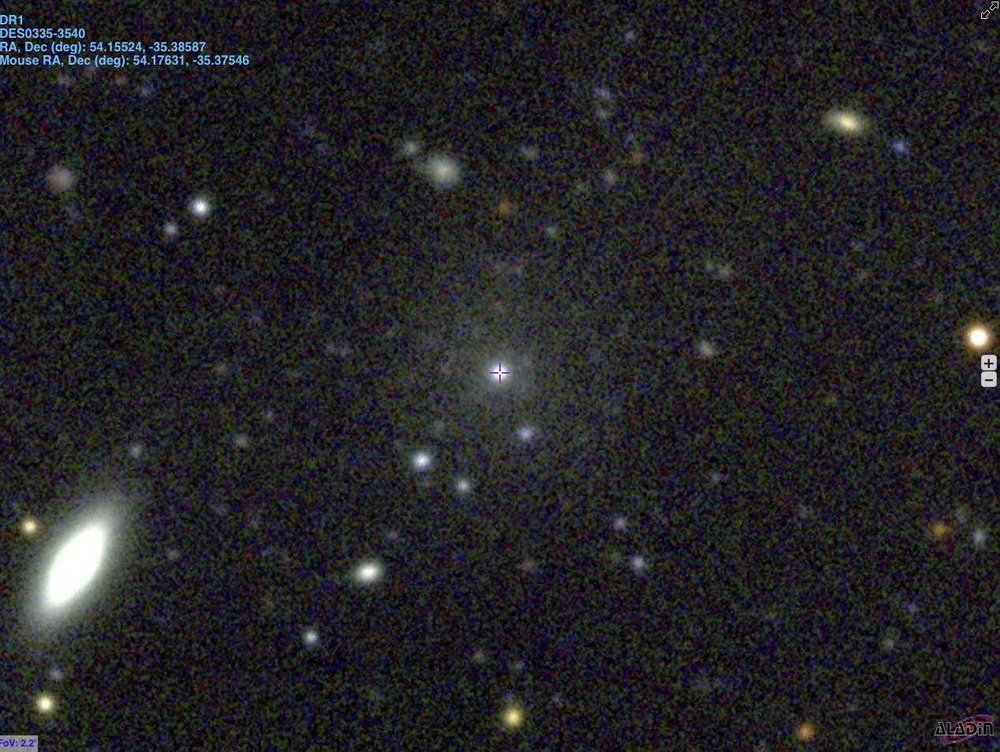

In [315]:
Image(filename='9.png')

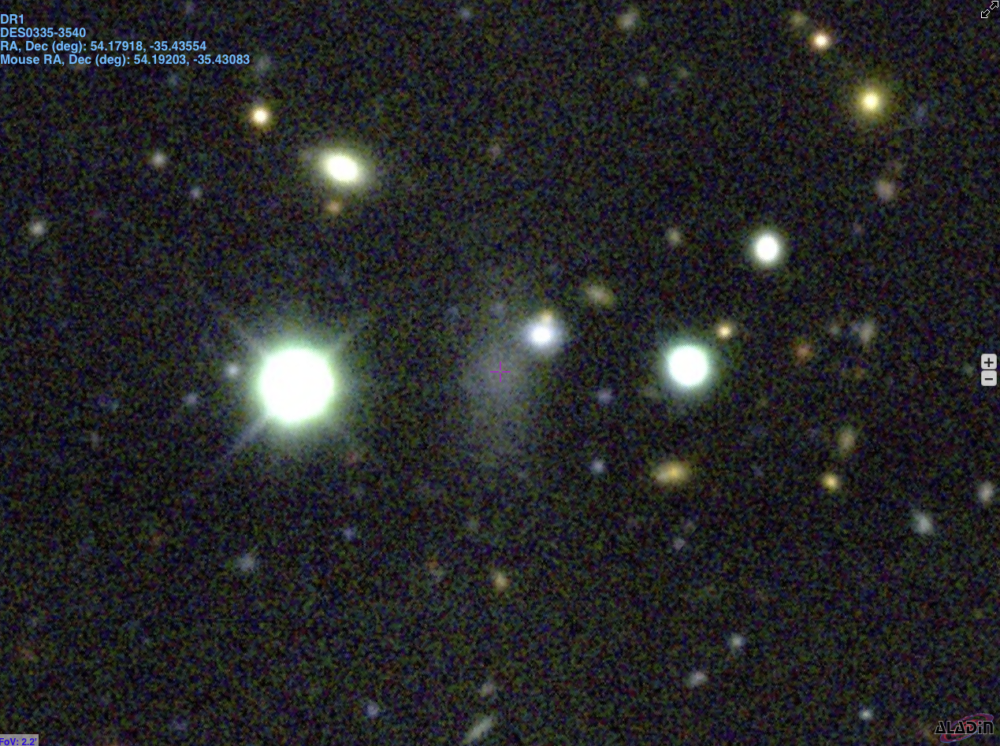

In [316]:
Image(filename='10.png')

In [317]:
#Image(filename='11.png')

Let's create a text file and store the properties of these galaxies.

In [318]:
np.savetxt('LSB_properties.dat', np.c_[RA_fin,DEC_fin,MAG_AUTO_G_fin,MAG_AUTO_R_fin,MAG_AUTO_I_fin, FLUX_RADIUS_G_fin, 
                                      FLUX_RADIUS_R_fin,FLUX_RADIUS_I_fin,KRON_RAD_fin,
                                       MU_EFF_G_fin,MU_EFF_R_fin,MU_EFF_I_fin,
                                       MU_MAX_G_fin,MU_MAX_R_fin,MU_MAX_I_fin,
                                       MU_MEAN_G_fin,MU_MEAN_R_fin,MU_MEAN_I_fin])

## Summary:

To summarize, we have 11 UDGs in the region:

\begin{equation}
 53.75 < RA < 54.25\\
 -35.50 < DEC < -35.25
\end{equation}

(This is a $15' \times 15'$ region).

You can see the galaxies above.

We created a .dat file. The columns are:

RA, DEC, Sextractor Auto magnitude_{g,r,i}, Flux Radius_{g,r,i} (in pixels), Kron radius, Effective surface brightnes_{g,r,i} (Effective model surface brightness (SB) above background [mag/sq. arcmin]),  Peak surface brightness above background [mag/asec^2]  (g,r,i), Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL (g,r,i)
